<a href="https://colab.research.google.com/github/anyacallissta/versatile_repo/blob/main/PCVK_Kelompok1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

--- Analisis Awal Kondisi Pencahayaan Citra Batik ---


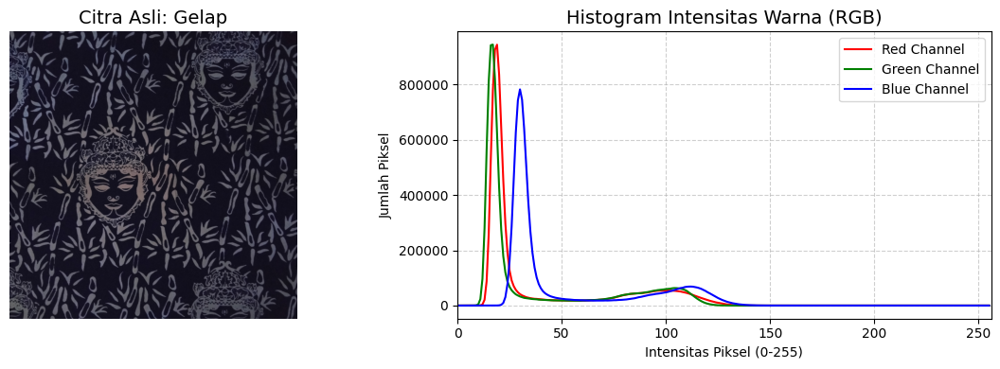

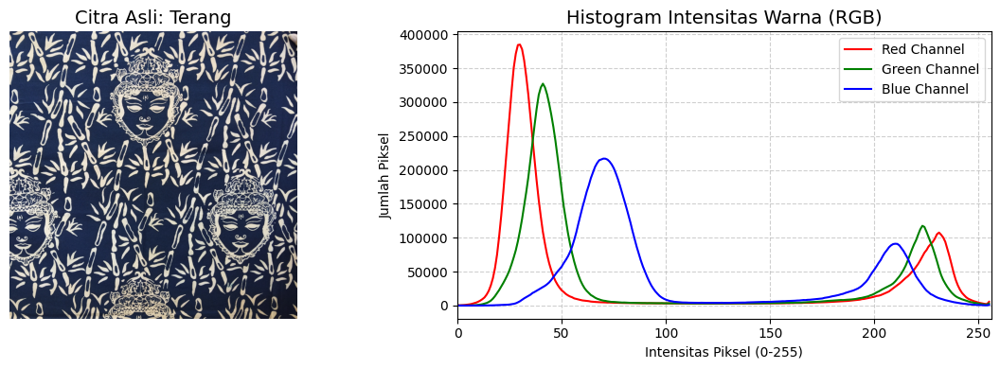

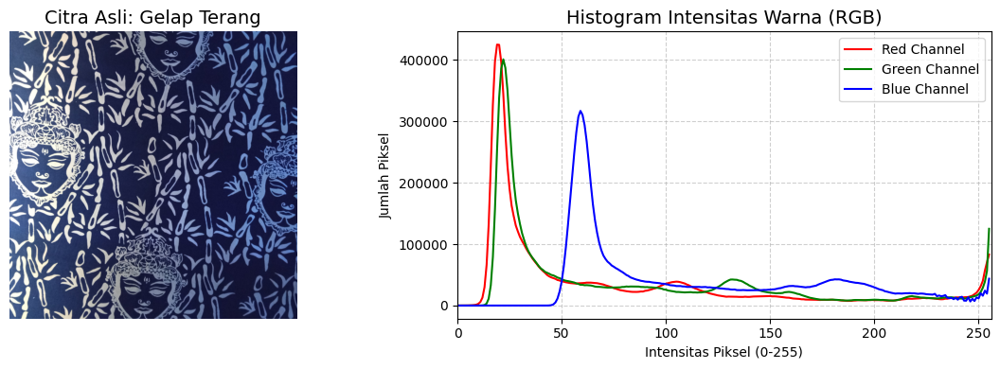

In [1]:
# ==============================================================================
# LANGKAH 1: SETUP AWAL & ANALISIS HISTOGRAM
# ==============================================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [15, 5]

file_paths = {
    "Gelap": 'batik gelap.jpg',
    "Terang": 'batik terang.jpg',
    "Gelap Terang": 'batik gelap terang.jpg'
}

# Memuat semua gambar dalam format BGR (default OpenCV)
images_rgb = {name: cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB) for name, path in file_paths.items()}

def display_image_and_rgb_hist(image, title):
    """
    Menampilkan gambar RGB beserta histogram untuk setiap channel warna (R, G, B).
    Fungsi ini dirancang untuk menyajikan data secara jelas untuk analisis.
    """
    plt.figure(figsize=(12, 4))

    # Plot 1: Menampilkan gambar
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(title, fontsize=14)
    plt.axis('off')

    # Plot 2: Menampilkan histogram RGB
    plt.subplot(1, 2, 2)
    colors = ('r', 'g', 'b')
    channel_names = ('Red', 'Green', 'Blue')
    for i, color in enumerate(colors):
        # Menghitung histogram untuk channel warna ke-i
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=color, label=f'{channel_names[i]} Channel')

    plt.title('Histogram Intensitas Warna (RGB)', fontsize=14)
    plt.xlabel('Intensitas Piksel (0-255)')
    plt.ylabel('Jumlah Piksel')
    plt.xlim([0, 256])
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

# Citra asli dan histogramnya
print("--- Analisis Awal Kondisi Pencahayaan Citra Batik ---")
for name, img in images_rgb.items():
    display_image_and_rgb_hist(img, f'Citra Asli: {name}')

--- Menerapkan Brightness/Contrast dengan Parameter Adaptif ---

--- Memproses Citra: 'Gelap' (alpha=1.9, beta=40) ---


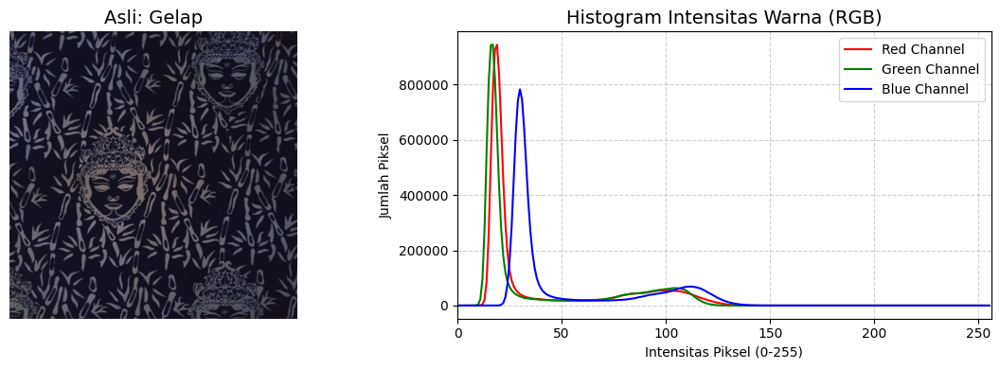

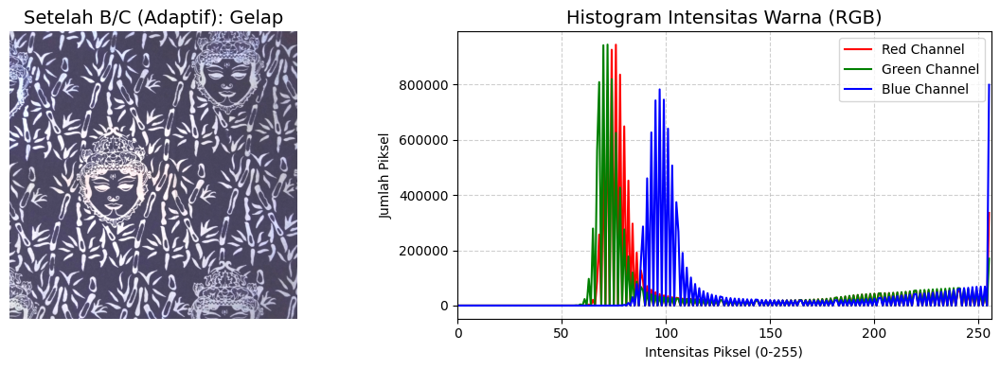


--- Memproses Citra: 'Terang' (alpha=1.2, beta=-50) ---


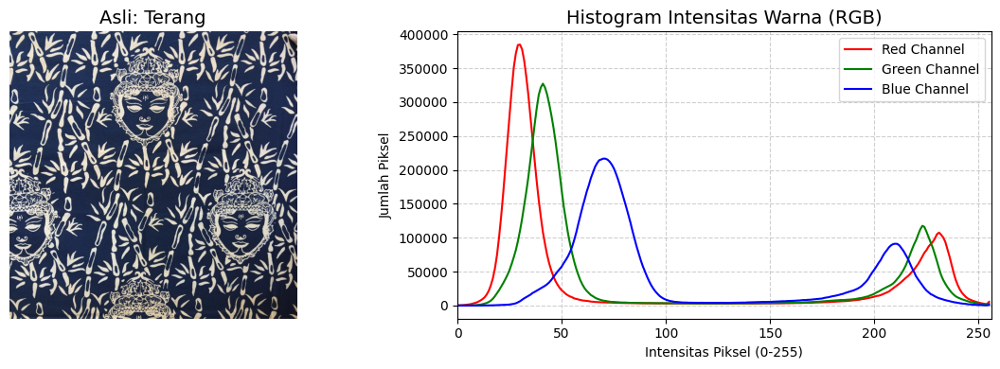

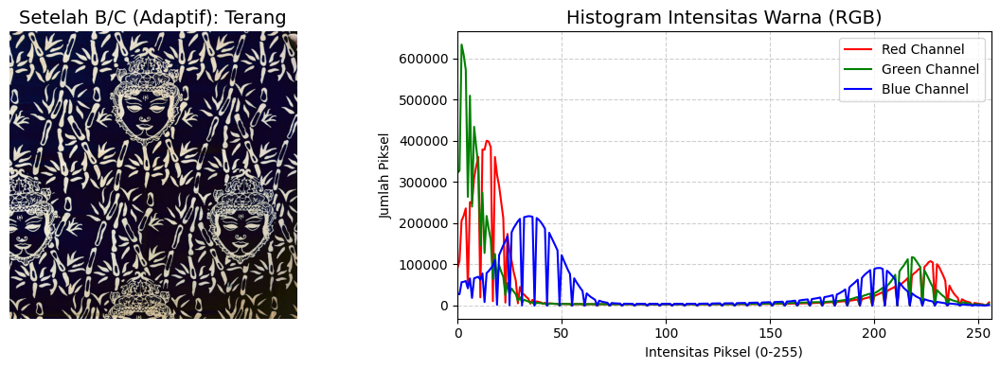


--- Memproses Citra: 'Gelap Terang' (alpha=1, beta=20) ---


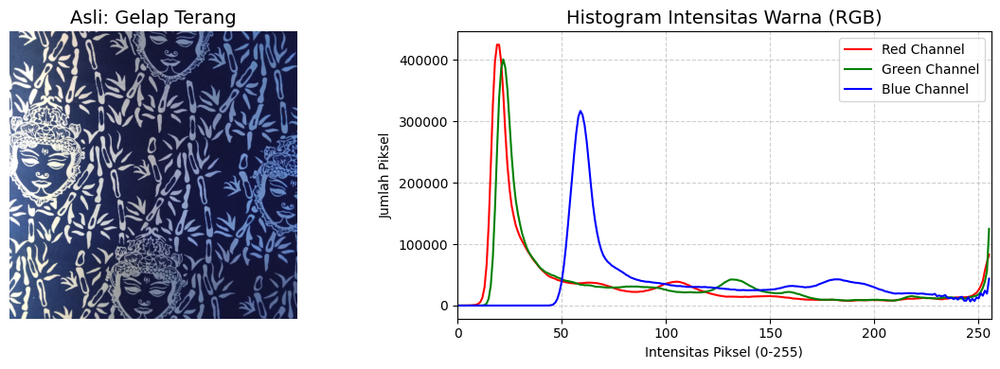

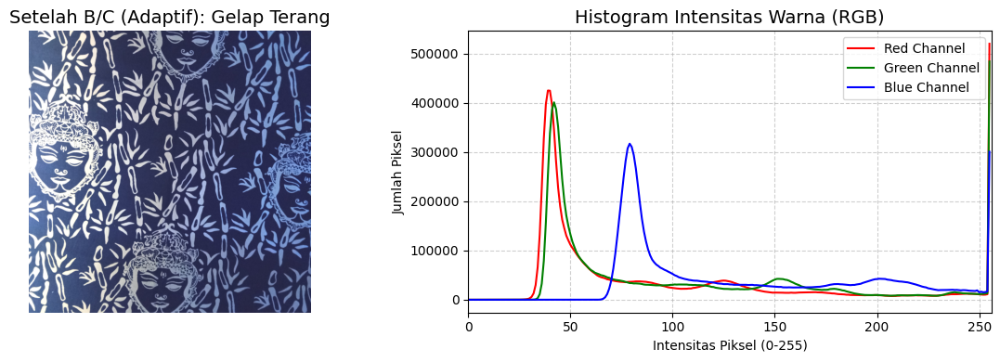

In [2]:
# ==============================================================================
# LANGKAH 2 (VERSI ADAPTIF): TRANSFORMASI BRIGHTNESS & CONTRAST
# ==============================================================================

params = {
    "Gelap": {"alpha": 1.9, "beta": 40},
    "Terang": {"alpha": 1.2, "beta": -50},
    "Gelap Terang": {"alpha": 1, "beta": 20}
}

images_bc_rgb = {}

print("--- Menerapkan Brightness/Contrast dengan Parameter Adaptif ---")

for name, img in images_rgb.items():
    # Mengambil nilai alpha dan beta yang spesifik untuk gambar saat ini dari dictionary 'params'
    current_alpha = params[name]["alpha"]
    current_beta = params[name]["beta"]

    print(f"\n--- Memproses Citra: '{name}' (alpha={current_alpha}, beta={current_beta}) ---")

    # Menerapkan transformasi linear dengan parameter yang sudah disesuaikan
    images_bc_rgb[name] = cv2.convertScaleAbs(img, alpha=current_alpha, beta=current_beta)

    # Menampilkan perbandingan sebelum dan sesudah untuk setiap gambar
    display_image_and_rgb_hist(img, f"Asli: {name}")
    display_image_and_rgb_hist(images_bc_rgb[name], f"Setelah B/C (Adaptif): {name}")

--- Menerapkan Histogram Equalization via Ruang Warna HSV ---

--- Hasil untuk Citra: Gelap ---


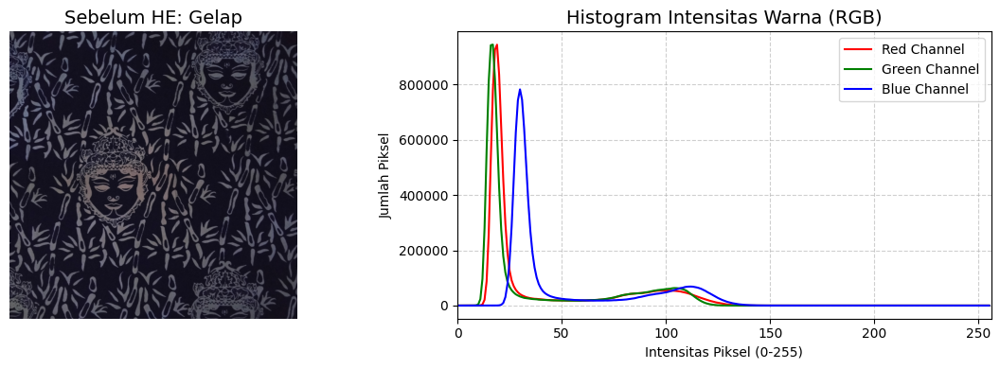

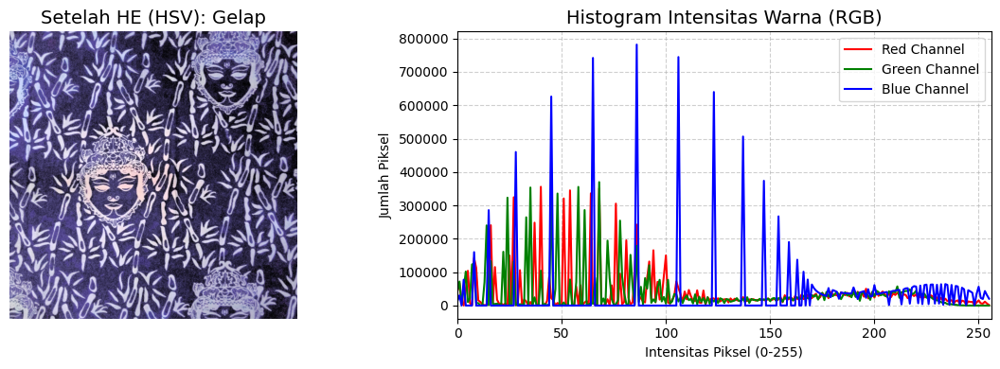


--- Hasil untuk Citra: Terang ---


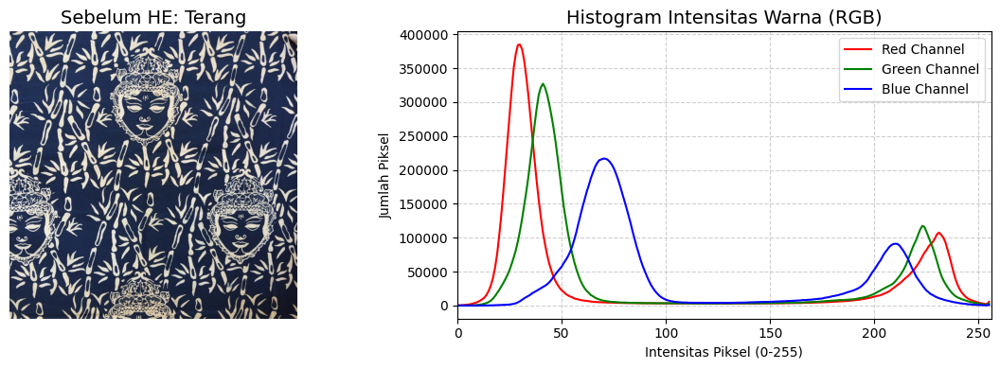

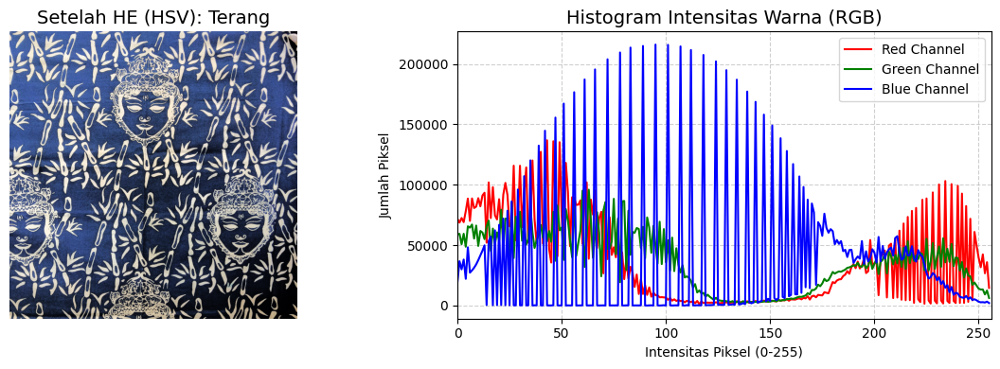


--- Hasil untuk Citra: Gelap Terang ---


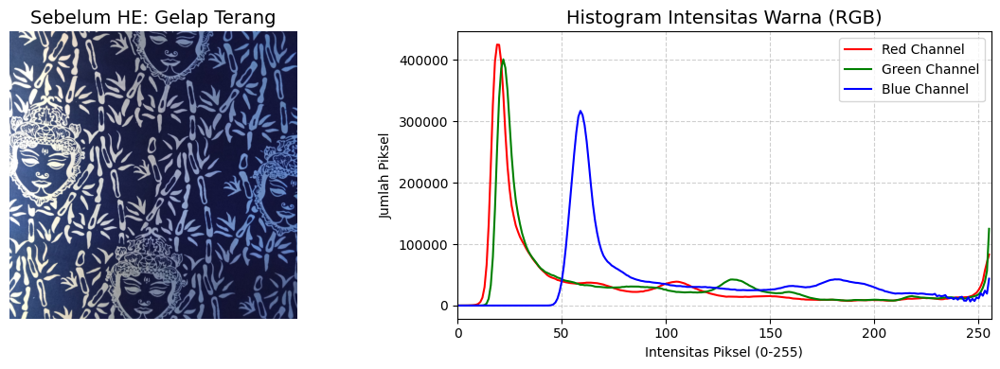

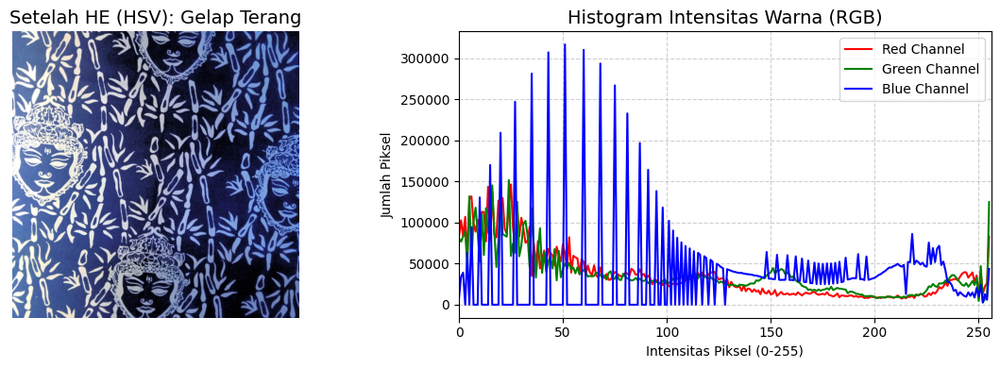

In [3]:
# ==============================================================================
# LANGKAH 3: HISTOGRAM EQUALIZATION (METODE HSV)
# ==============================================================================
images_he_rgb = {}
print("--- Menerapkan Histogram Equalization via Ruang Warna HSV ---")

for name, img in images_rgb.items():
    # 1. Konversi dari RGB ke HSV untuk memisahkan intensitas (Value) dari warna (Hue, Saturation)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(img_hsv)

    # 2. Terapkan equalization HANYA pada channel V (Value/Kecerahan)
    v_equalized = cv2.equalizeHist(v)

    # 3. Gabungkan kembali channel yang sudah diperbaiki
    img_hsv_equalized = cv2.merge([h, s, v_equalized])

    # 4. Konversi kembali ke RGB untuk ditampilkan
    images_he_rgb[name] = cv2.cvtColor(img_hsv_equalized, cv2.COLOR_HSV2RGB)

    print(f"\n--- Hasil untuk Citra: {name} ---")
    display_image_and_rgb_hist(img, f"Sebelum HE: {name}")
    display_image_and_rgb_hist(images_he_rgb[name], f"Setelah HE (HSV): {name}")

--- Menerapkan Filter High-Pass untuk Menajamkan Tepi Motif ---

--- Hasil untuk Citra: Gelap ---


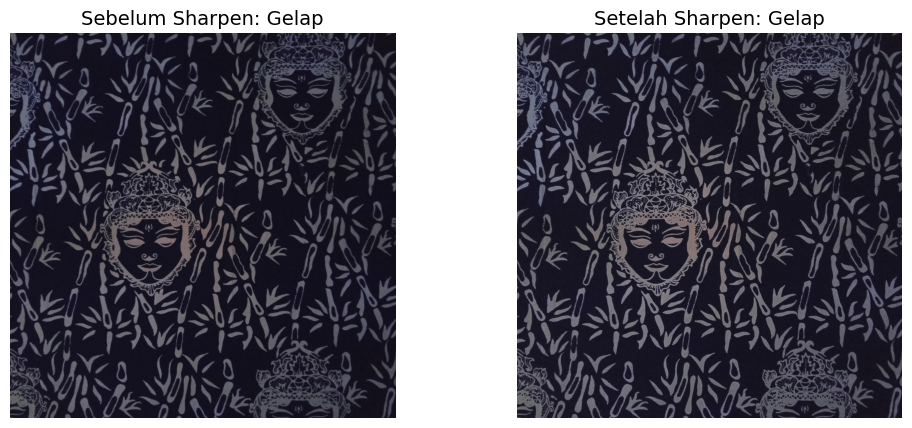


--- Hasil untuk Citra: Terang ---


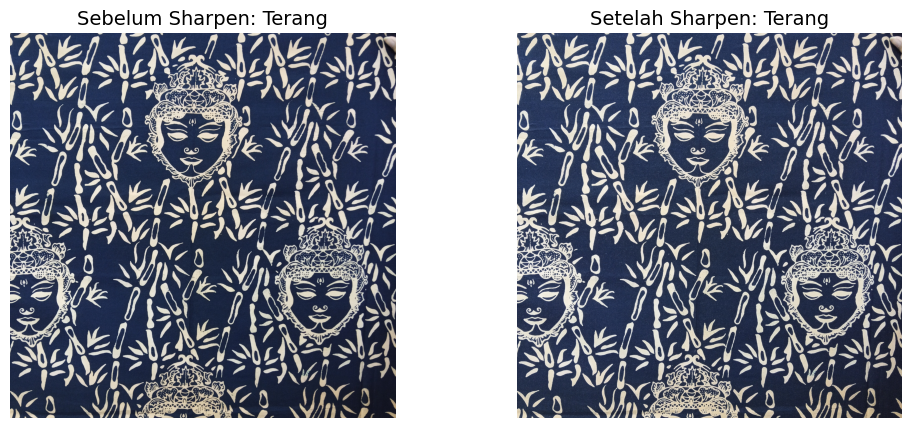


--- Hasil untuk Citra: Gelap Terang ---


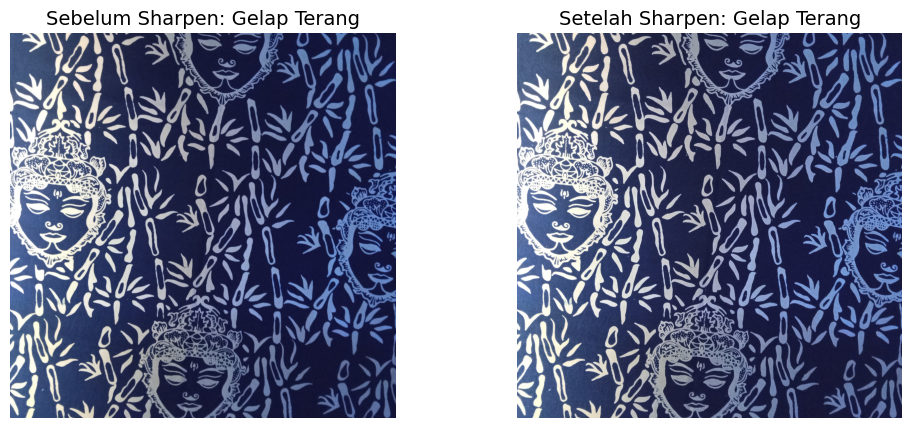

In [4]:
# ==============================================================================
# LANGKAH 4: FILTER SPASIAL (HIGH-PASS UNTUK SHARPENING)
# ==============================================================================
images_hp_rgb = {}
# Kernel Laplacian untuk mendeteksi tepi
kernel_hp = np.array([[-1, -1, -1],
                      [-1,  8, -1],
                      [-1, -1, -1]])
print("--- Menerapkan Filter High-Pass untuk Menajamkan Tepi Motif ---")

for name, img in images_rgb.items():
    # Menerapkan kernel filter pada gambar
    img_hp_raw_rgb = cv2.filter2D(img, -1, kernel_hp)
    # Menambahkan hasil filter (hanya tepi) ke gambar asli untuk efek penajaman
    images_hp_rgb[name] = cv2.add(img, img_hp_raw_rgb)

    print(f"\n--- Hasil untuk Citra: {name} ---")
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1); plt.imshow(img); plt.title(f'Sebelum Sharpen: {name}', fontsize=14); plt.axis('off')
    plt.subplot(1, 2, 2); plt.imshow(images_hp_rgb[name]); plt.title(f'Setelah Sharpen: {name}', fontsize=14); plt.axis('off')
    plt.show()

--- Menerapkan Filter Low-Pass untuk Menghaluskan Citra ---

--- Hasil untuk Citra: Gelap ---


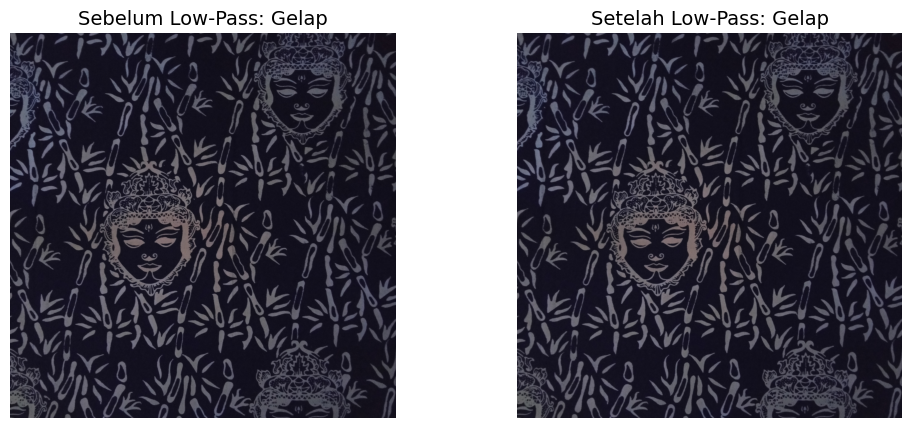


--- Hasil untuk Citra: Terang ---


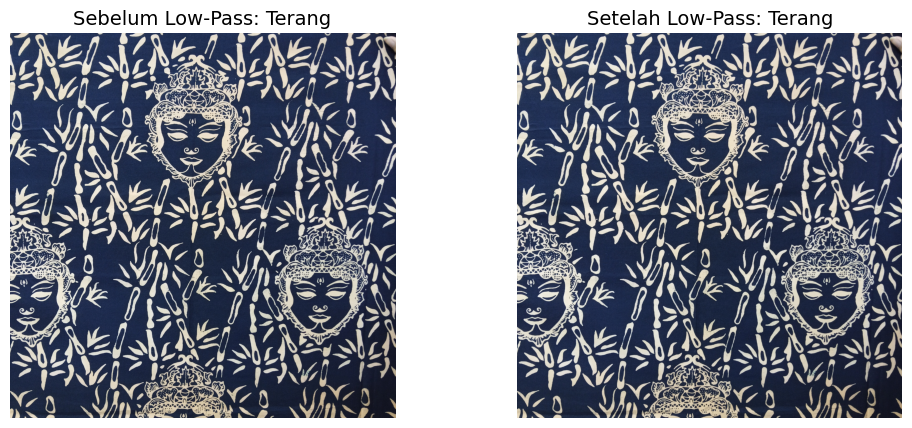


--- Hasil untuk Citra: Gelap Terang ---


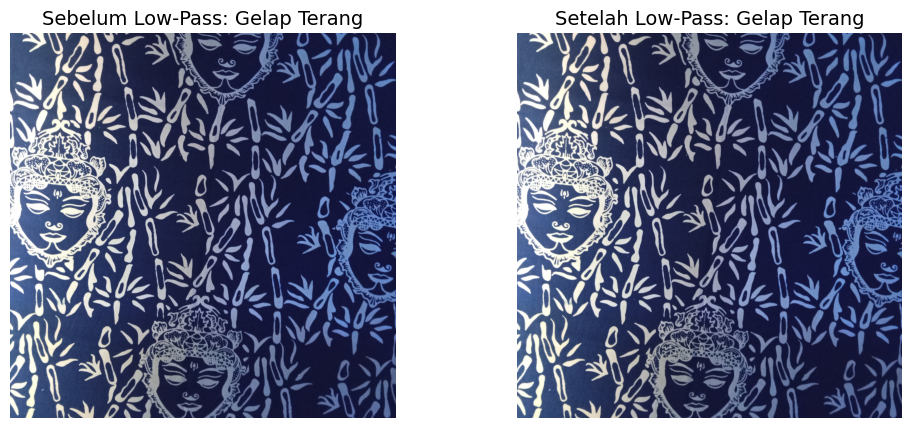

In [5]:
# ==============================================================================
# LANGKAH 4: FILTER SPASIAL (LOW-PASS UNTUK SMOOTHING)
# ==============================================================================
images_lp_rgb = {}

# Kernel rata-rata (mean filter) untuk smoothing (low-pass)
kernel_lp = np.ones((3, 3), np.float32) / 9
print("--- Menerapkan Filter Low-Pass untuk Menghaluskan Citra ---")

for name, img in images_rgb.items():
    # Terapkan filter dengan konvolusi
    img_lp_rgb = cv2.filter2D(img, -1, kernel_lp)

    images_lp_rgb[name] = img_lp_rgb

    print(f"\n--- Hasil untuk Citra: {name} ---")
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1); plt.imshow(img); plt.title(f'Sebelum Low-Pass: {name}', fontsize=14); plt.axis('off')
    plt.subplot(1, 2, 2); plt.imshow(img_lp_rgb); plt.title(f'Setelah Low-Pass: {name}', fontsize=14); plt.axis('off')
    plt.show()


Menerapkan Dithering (4-bit per channel)

--- Hasil untuk Citra: Gelap ---


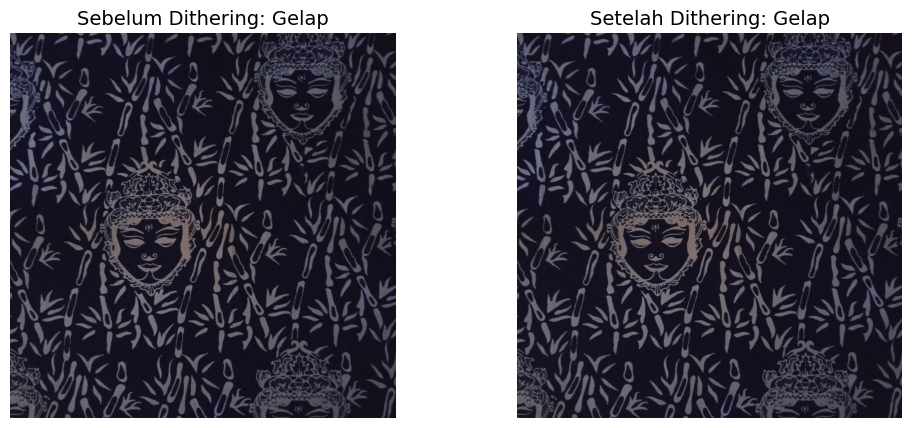

--- Hasil untuk Citra: Terang ---


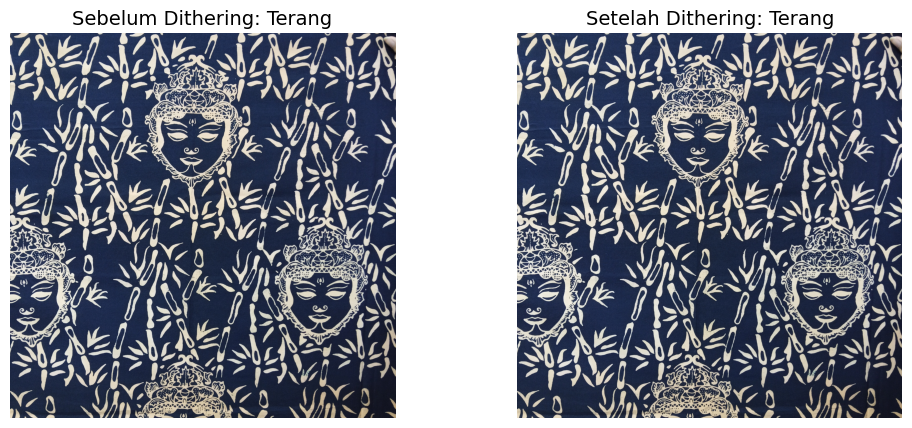

--- Hasil untuk Citra: Gelap Terang ---


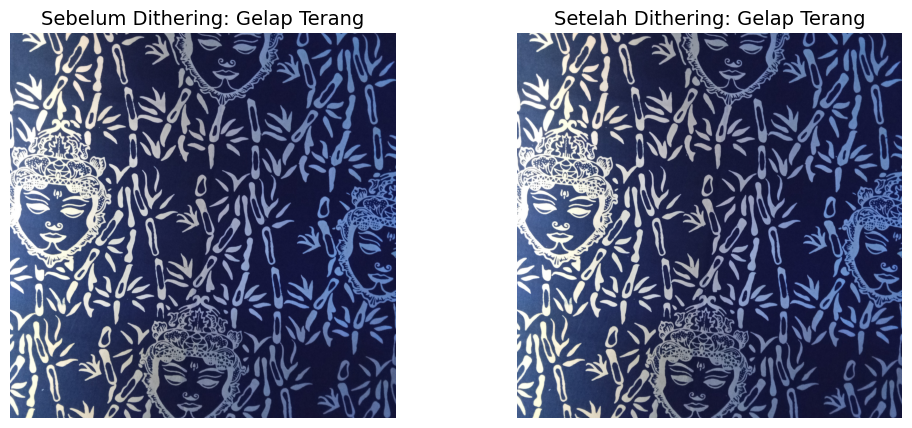

In [6]:
# --- LANGKAH 5 (RGB): FLOYD-STEINBERG DITHERING UNTUK 3 GAMBAR ---
def floyd_steinberg_dithering(image_channel, bit_depth):
    img_float = image_channel.astype(np.float32)
    h, w = img_float.shape
    num_levels = 2**bit_depth
    for y in range(h):
        for x in range(w):
            old_pixel = img_float[y, x]
            new_pixel = np.round(old_pixel / 255 * (num_levels - 1)) / (num_levels - 1) * 255
            img_float[y, x] = new_pixel
            quant_error = old_pixel - new_pixel
            if x + 1 < w: img_float[y, x + 1] += quant_error * 7 / 16
            if x - 1 >= 0 and y + 1 < h: img_float[y + 1, x - 1] += quant_error * 3 / 16
            if y + 1 < h: img_float[y + 1, x] += quant_error * 5 / 16
            if x + 1 < w and y + 1 < h: img_float[y + 1, x + 1] += quant_error * 1 / 16
    return np.clip(img_float, 0, 255).astype(np.uint8)

images_dithered_rgb = {}
bit_depth = 4
print(f"Menerapkan Dithering ({bit_depth}-bit per channel)\n")

for name, img in images_rgb.items():
    r, g, b = cv2.split(img)
    r_d = floyd_steinberg_dithering(r, bit_depth)
    g_d = floyd_steinberg_dithering(g, bit_depth)
    b_d = floyd_steinberg_dithering(b, bit_depth)
    images_dithered_rgb[name] = cv2.merge([r_d, g_d, b_d])

    print(f"--- Hasil untuk Citra: {name} ---")
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1); plt.imshow(img); plt.title(f'Sebelum Dithering: {name}', fontsize=14); plt.axis('off')
    plt.subplot(1, 2, 2); plt.imshow(images_dithered_rgb[name]); plt.title(f'Setelah Dithering: {name}', fontsize=14); plt.axis('off')
    plt.show()

--- Pipeline Pra-Pemrosesan Lengkap untuk Citra: 'Gelap' ---


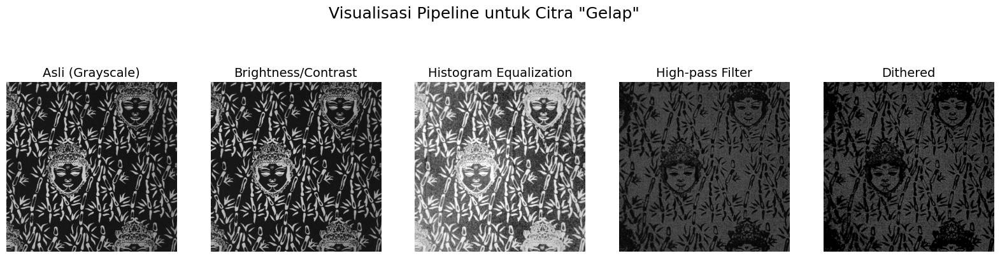

--- Pipeline Pra-Pemrosesan Lengkap untuk Citra: 'Terang' ---


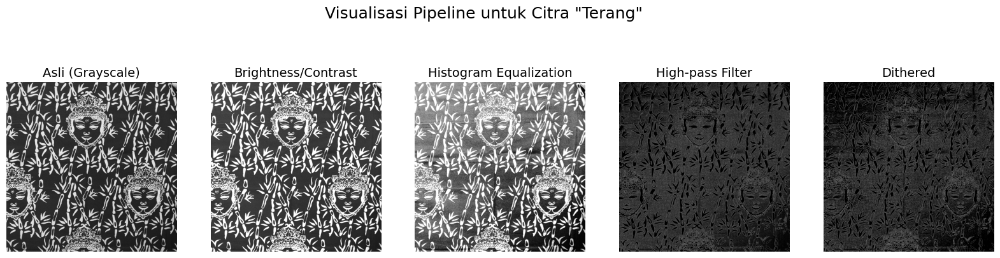

--- Pipeline Pra-Pemrosesan Lengkap untuk Citra: 'Gelap Terang' ---


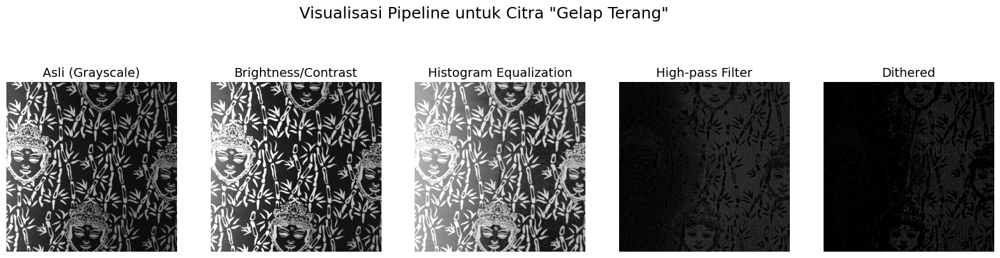

In [7]:
# =================================================================================
# BAGIAN C: IMPLEMENTASI PIPELINE LENGKAP UNTUK SEMUA CITRA DALAM BENTUK GRAYSCALE
# =================================================================================

images_rgb = {name: cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
              for name, path in file_paths.items()}

# Kernel High-pass
kernel_hp = np.array([[-1, -1, -1],
                      [-1,  8, -1],
                      [-1, -1, -1]])

for name, img_rgb in images_rgb.items():

    print(f"--- Pipeline Pra-Pemrosesan Lengkap untuk Citra: '{name}' ---")

    # Tahap 0: Grayscale
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    # Tahap 1: Brightness & Contrast
    b, a = 30, 1.2
    img_bc = cv2.convertScaleAbs(gray, alpha=a, beta=b)

    # Tahap 2: Histogram Equalization
    img_he = cv2.equalizeHist(img_bc)

    # Tahap 3: Spatial Filtering (High-pass / Sharpen)
    img_hp = cv2.filter2D(img_he, -1, kernel_hp)

    # Tahap 4: Dithering (contoh menggunakan Floyd-Steinberg)
    img_dithered = (img_hp > 128).astype(np.uint8) * 255  # simple thresholding dither

    # Visualisasi pipeline
    titles = ['Asli (Grayscale)', 'Brightness/Contrast', 'Histogram Equalization',
              'High-pass Filter', 'Dithered']
    images_pipeline = [gray, img_bc, img_he, img_hp, img_dithered]

    plt.figure(figsize=(20, 5))
    for i, image in enumerate(images_pipeline):
        plt.subplot(1, len(images_pipeline), i + 1)
        plt.imshow(image, cmap='gray')
        plt.title(titles[i], fontsize=14)
        plt.axis('off')

    plt.suptitle(f'Visualisasi Pipeline untuk Citra "{name}"', fontsize=18, y=1.0)
    plt.show()


=== Hasil Evaluasi Citra: Terang ===
MSE, RMSE, dan PSNR terhadap citra asli:
Brightness/Contrast (Adaptif): MSE = 743.68 | RMSE = 27.27 | PSNR = 19.42 dB
Histogram Equalization (HSV):  MSE = 862.30 | RMSE = 29.36 | PSNR = 18.77 dB
High-pass (Sharpening):        MSE = 345.93 | RMSE = 18.60 | PSNR = 22.74 dB
Low-pass (Smoothing):          MSE = 38.42 | RMSE = 6.20 | PSNR = 32.29 dB
Dithering:                     MSE = 37.76 | RMSE = 6.14 | PSNR = 32.36 dB


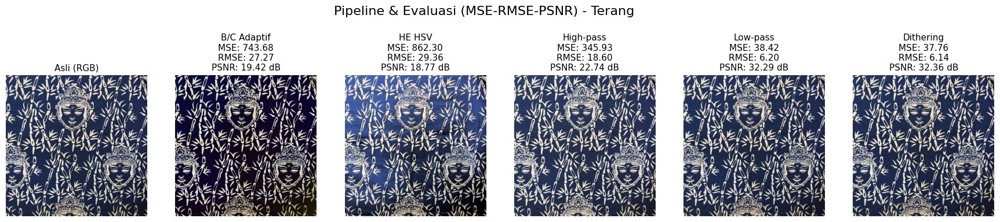

In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

file_paths = {"Terang": 'batik terang.jpg'}

images_rgb = {name: cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
              for name, path in file_paths.items()}

# Fungsi menghitung MSE, RMSE, dan PSNR untuk citra RGB
def calculate_mse_rmse_psnr(original, processed):
    mse = np.mean((original.astype(np.float32) - processed.astype(np.float32)) ** 2)
    rmse = np.sqrt(mse)
    if mse == 0:
        psnr = float('inf')
    else:
        PIXEL_MAX = 255.0
        psnr = 10 * np.log10((PIXEL_MAX ** 2) / mse)
    return mse, rmse, psnr

# Hitung MSE, RMSE, PSNR dan tampilkan citra
for name in images_rgb.keys():
    img_orig = images_rgb[name]        # citra asli
    img_bc   = images_bc_rgb[name]     # Brightness/Contrast adaptif
    img_he   = images_he_rgb[name]     # Histogram Equalization HSV
    img_hp   = images_hp_rgb[name]     # High-pass (sharpening)
    img_lp   = images_lp_rgb[name]     # Low-pass (smoothing)
    img_d    = images_dithered_rgb[name] # Dithering

    # Hitung MSE, RMSE, dan PSNR terhadap citra asli
    mse_bc, rmse_bc, psnr_bc = calculate_mse_rmse_psnr(img_orig, img_bc)
    mse_he, rmse_he, psnr_he = calculate_mse_rmse_psnr(img_orig, img_he)
    mse_hp, rmse_hp, psnr_hp = calculate_mse_rmse_psnr(img_orig, img_hp)
    mse_lp, rmse_lp, psnr_lp = calculate_mse_rmse_psnr(img_orig, img_lp)
    mse_d,  rmse_d,  psnr_d  = calculate_mse_rmse_psnr(img_orig, img_d)

    # Hasil MSE, RMSE, dan PSNR
    print(f"\n=== Hasil Evaluasi Citra: {name} ===")
    print("MSE, RMSE, dan PSNR terhadap citra asli:")
    print(f"Brightness/Contrast (Adaptif): MSE = {mse_bc:.2f} | RMSE = {rmse_bc:.2f} | PSNR = {psnr_bc:.2f} dB")
    print(f"Histogram Equalization (HSV):  MSE = {mse_he:.2f} | RMSE = {rmse_he:.2f} | PSNR = {psnr_he:.2f} dB")
    print(f"High-pass (Sharpening):        MSE = {mse_hp:.2f} | RMSE = {rmse_hp:.2f} | PSNR = {psnr_hp:.2f} dB")
    print(f"Low-pass (Smoothing):          MSE = {mse_lp:.2f} | RMSE = {rmse_lp:.2f} | PSNR = {psnr_lp:.2f} dB")
    print(f"Dithering:                     MSE = {mse_d:.2f} | RMSE = {rmse_d:.2f} | PSNR = {psnr_d:.2f} dB")

    # Visualisasi pipeline citra
    images_pipeline = [img_orig, img_bc, img_he, img_hp, img_lp, img_d]
    titles = [
        'Asli (RGB)',
        f'B/C Adaptif\nMSE: {mse_bc:.2f}\nRMSE: {rmse_bc:.2f}\nPSNR: {psnr_bc:.2f} dB',
        f'HE HSV\nMSE: {mse_he:.2f}\nRMSE: {rmse_he:.2f}\nPSNR: {psnr_he:.2f} dB',
        f'High-pass\nMSE: {mse_hp:.2f}\nRMSE: {rmse_hp:.2f}\nPSNR: {psnr_hp:.2f} dB',
        f'Low-pass\nMSE: {mse_lp:.2f}\nRMSE: {rmse_lp:.2f}\nPSNR: {psnr_lp:.2f} dB',
        f'Dithering\nMSE: {mse_d:.2f}\nRMSE: {rmse_d:.2f}\nPSNR: {psnr_d:.2f} dB'
    ]

    plt.figure(figsize=(22, 5))
    for i, img in enumerate(images_pipeline):
        plt.subplot(1, len(images_pipeline), i+1)
        plt.imshow(img)
        plt.title(titles[i], fontsize=11)
        plt.axis('off')
    plt.suptitle(f'Pipeline & Evaluasi (MSE-RMSE-PSNR) - {name}', fontsize=16)
    plt.show()